
## **2. Data Cleaning, Pre-processing and EDA**


In [1]:
#IMPORTING LIBRARIES:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', 100)
sns.set_style("darkgrid")

from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import re

from sklearn.feature_extraction.text import CountVectorizer

# IF YOU ARE MISSING "WordCloud":
# TRY INSTALLING VIA TERMINAL LIKE THIS: /anaconda3/bin/python -m pip install wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image
# IF YOU ARE MISSING "wordninja":
# TRY INSTALLING VIA TERMINAL LIKE THIS: pip install wordninja
import wordninja


%matplotlib inline
import scattertext as st
import re, io
from pprint import pprint
from scipy.stats import rankdata, hmean, norm
import spacy
import os, pkgutil, json, urllib
from urllib.request import urlopen
from IPython.display import IFrame
from IPython.display import display, HTML
from scattertext import CorpusFromPandas, produce_scattertext_explorer
display(HTML("<style>.container { width:98% !important; }</style>"))

### 2.1 Data Cleaning 

Reduicing data such as selecting important columns, filling missing values, removing symbols, etc

In [2]:
#IMPORTING CSV FILES from what was extracteed recently and data retreived from kaggle
depression = pd.read_csv('../data/depression.csv')
suicide_watch = pd.read_csv('../data/suicide_watch.csv')
depression_old = pd.read_csv('../data/OLD_DATA/depression.csv')
suicide_old =pd.read_csv('../data/OLD_DATA/suicide_watch.csv')

In [3]:
#PEEKING INTO THE DEPRESSION DATA SET
pd.set_option('display.max_columns', 500)
depression.head(5)

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,top_awarded_type,hide_score,name,quarantine,link_flair_text_color,upvote_ratio,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,is_created_from_ads_ui,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,can_gild,spoiler,locked,author_flair_text,treatment_tags,visited,removed_by,num_reports,distinguished,subreddit_id,author_is_blocked,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,call_to_action,author_cakeday,is_suicide
0,NaN,depression,Welcome to /r/depression's check-in post - a p...,t2_64qjj,False,NaN,0,False,"Regular check-in post, with information about ...",[],r/depression,False,0,NaN,0,NaN,False,t3_xgpxny,False,dark,0.97,NaN,public,34,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,34,NaN,False,False,NaN,1663432672.0,NaN,[],{},NaN,True,NaN,1.663430e+09,text,0,NaN,NaN,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,new,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,[],False,NaN,NaN,moderator,t5_2qqqf,False,NaN,NaN,NaN,xgpxny,True,NaN,circinia,NaN,122,False,no_ads,False,[],False,NaN,/r/depression/comments/xgpxny/regular_checkin_...,no_ads,True,https://www.reddit.com/r/depression/comments/x...,906655,1.663430e+09,0,NaN,False,NaN,NaN,0
1,NaN,depression,We understand that most people who reply immed...,t2_1t70,False,NaN,3,False,Our most-broken and least-understood rules is ...,[],r/depression,False,0,NaN,0,NaN,False,t3_doqwow,False,dark,1.00,NaN,public,2358,304,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,2358,NaN,False,True,NaN,False,NaN,[],"{'gid_1': 23, 'gid_2': 3}",NaN,True,NaN,1.572361e+09,text,0,NaN,NaN,text,self.depression,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,confidence,NaN,NaN,True,False,False,False,False,"[{'giver_coin_reward': None, 'subreddit_id': N...",[],False,False,False,False,NaN,[],False,NaN,NaN,moderator,t5_2qqqf,False,NaN,NaN,NaN,doqwow,True,NaN,SQLwitch,NaN,180,True,no_ads,False,[],False,NaN,/r/depression/comments/doqwow/our_mostbroken_a...,no_ads,True,https://www.reddit.com/r/depression/comments/d...,906655,1.572361e+09,2,NaN,False,NaN,NaN,0
2,NaN,depression,"I‘m only turning 22 next year, but it feels sc...",t2_11sxo4,False,NaN,0,False,"I hate getting older, I want to be a kid again...",[],r/depression,False,0,NaN,0,NaN,False,t3_xxjlyw,False,dark,0.95,NaN,public,123,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,123,NaN,False,False,NaN,False,NaN,[],{},NaN,True,NaN,1.665099e+09,text,0,NaN,NaN,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,confidence,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,[],False,NaN,NaN,NaN,t5_2qqqf,False,NaN,NaN,NaN,xxjlyw,True,NaN,Myechomyshadowandme,NaN,24,True,no_ads,False,[],False,NaN,/r/depression/comments/xxjlyw/i_hate_getting_o...,no_ads,False,https://www.reddit.com/r/depression/comments/x...,906655,1.665099e+09,0,NaN,False,NaN,NaN,0
3,NaN,depression,"Okay, so. Trigger warnings up the wazoo. \n\nI...",t2_2vma8ndr,False,NaN,0,False

In [4]:
depression[depression["author_fullname"]=="t2_64qjj"]

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,top_awarded_type,hide_score,name,quarantine,link_flair_text_color,upvote_ratio,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,is_created_from_ads_ui,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,can_gild,spoiler,locked,author_flair_text,treatment_tags,visited,removed_by,num_reports,distinguished,subreddit_id,author_is_blocked,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,call_to_action,author_cakeday,is_suicide
0,NaN,depression,Welcome to /r/depression's check-in post - a p...,t2_64qjj,False,NaN,0,False,"Regular check-in post, with information about ...",[],r/depression,False,0,NaN,0,NaN,False,t3_xgpxny,False,dark,0.97,NaN,public,34,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,34,NaN,False,False,NaN,1663432672.0,NaN,[],{},NaN,True,NaN,1.663430e+09,text,0,NaN,NaN,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,new,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,[],False,NaN,NaN,moderator,t5_2qqqf,False,NaN,NaN,NaN,xgpxny,True,NaN,circinia,NaN,122,False,no_ads,False,[],False,NaN,/r/depression/comments/xgpxny/regular_checkin_...,no_ads,True,https://www.reddit.com/r/depression/comments/x...,906655,1.663430e+09,0,NaN,False,NaN,NaN,0


In [5]:
suicide_watch.head(5)

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,top_awarded_type,hide_score,name,quarantine,link_flair_text_color,upvote_ratio,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,is_created_from_ads_ui,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,can_gild,spoiler,locked,author_flair_text,treatment_tags,visited,removed_by,num_reports,distinguished,subreddit_id,author_is_blocked,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,call_to_action,author_cakeday,link_flair_template_id,is_suicide
0,NaN,SuicideWatch,We've been seeing a worrying increase in pro-s...,t2_1t70,False,NaN,1,False,New wiki on how to avoid accidentally encourag...,[],r/SuicideWatch,False,0,NaN,0,NaN,False,t3_cz6nfd,False,dark,0.99,NaN,public,1778,128,{},2a7b5518-8e45-11e5-a506-0ed10b342609,False,[],NaN,False,False,NaN,{},NaN,False,1778,NaN,False,True,NaN,1600562141.0,modmsg,[],"{'gid_1': 36, 'gid_2': 1}",NaN,True,NaN,1.567526e+09,text,0,NaN,NaN,text,self.SuicideWatch,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,NaN,NaN,NaN,True,False,False,False,False,"[{'giver_coin_reward': None, 'subreddit_id': N...",[],False,False,False,False,NaN,[],False,NaN,NaN,moderator,t5_2qpzs,False,NaN,NaN,NaN,cz6nfd,True,NaN,SQLwitch,NaN,251,True,no_ads,False,[],False,dark,/r/SuicideWatch/comments/cz6nfd/new_wiki_on_ho...,no_ads,True,https://www.reddit.com/r/SuicideWatch/comments...,381743,1.567526e+09,0,NaN,False,NaN,NaN,NaN,1
1,NaN,SuicideWatch,"Activism, i.e. advocating or fundraising for s...",t2_1t70,False,NaN,0,False,Please remember that NO ACTIVISM of any kind i...,[],r/SuicideWatch,False,0,NaN,0,NaN,False,t3_pl9suy,False,dark,0.99,NaN,public,715,3,{},2a7b5518-8e45-11e5-a506-0ed10b342609,False,[],NaN,False,False,NaN,{},NaN,False,715,NaN,False,True,NaN,1631233334.0,modmsg,[],{'gid_1': 3},NaN,True,NaN,1.631232e+09,text,0,NaN,NaN,text,self.SuicideWatch,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,NaN,NaN,NaN,True,False,False,False,False,"[{'giver_coin_reward': None, 'subreddit_id': N...",[],False,False,False,False,NaN,[],False,NaN,NaN,moderator,t5_2qpzs,False,NaN,NaN,NaN,pl9suy,True,NaN,SQLwitch,NaN,43,True,no_ads,False,[],False,dark,/r/SuicideWatch/comments/pl9suy/please_remembe...,no_ads,True,https://www.reddit.com/r/SuicideWatch/comments...,381743,1.631232e+09,0,NaN,False,NaN,NaN,NaN,1
2,NaN,SuicideWatch,NaN,t2_8t8wj7fg,False,NaN,0,False,The worst part is when you reach the stage whe...,[],r/SuicideWatch,False,0,NaN,0,NaN,False,t3_xx7r4e,False,dark,1.00,NaN,public,444,0,{},2a7b5518-8e45-11e5-a506-0ed10b342609,False,[],NaN,False,False,NaN,{},NaN,False,444,NaN,False,False,NaN,False,modmsg,[],{},NaN,True,NaN,1.665069e+09,text,0,NaN,NaN,text,self.SuicideWatch,True,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,[],False,NaN,NaN,NaN,t5_2qpzs,False,NaN,NaN,NaN,xx7r4e,True,NaN,Photoboistie,NaN,38,True,no_ads,False,[],False,dark,/r/SuicideWatch/comments/xx7r4e/the_worst_part...,no_ads,False,https://www.reddit.com/r/SuicideWatch/comments...,381743,1.665069e+09,0,NaN,False,NaN,Na

In [6]:
depression_old.head()

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,hide_score,name,quarantine,link_flair_text_color,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,can_gild,spoiler,locked,author_flair_text,visited,removed_by,num_reports,distinguished,subreddit_id,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,is_suicide
0,NaN,depression,We understand that most people who reply immed...,t2_1t70,False,NaN,0,False,Our most-broken and least-understood rules is ...,[],r/depression,False,0.0,NaN,0,False,t3_doqwow,False,dark,NaN,public,1818,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,1818,NaN,True,NaN,False,NaN,[],{},NaN,True,NaN,1.572390e+09,text,0.0,NaN,NaN,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,confidence,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,False,NaN,NaN,moderator,t5_2qqqf,NaN,NaN,NaN,doqwow,True,NaN,SQLwitch,NaN,133,True,no_ads,False,[],False,NaN,/r/depression/comments/doqwow/our_mostbroken_a...,no_ads,True,https://www.reddit.com/r/depression/comments/d...,611580,1.572361e+09,0,NaN,False,0
1,NaN,depression,Welcome to /r/depression's check-in post - a p...,t2_64qjj,False,NaN,0,False,Regular Check-In Post,[],r/depression,False,0.0,NaN,0,False,t3_exo6f1,False,dark,NaN,public,310,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,310,NaN,False,NaN,False,NaN,[],{},NaN,True,NaN,1.580678e+09,text,0.0,NaN,NaN,text,self.depression,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,new,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,False,NaN,NaN,moderator,t5_2qqqf,NaN,NaN,NaN,exo6f1,True,NaN,circinia,NaN,1644,False,no_ads,False,[],False,NaN,/r/depression/comments/exo6f1/regular_checkin_...,no_ads,True,https://www.reddit.com/r/depression/comments/e...,611580,1.580649e+09,0,NaN,False,0
2,NaN,depression,I've been feeling really depressed and lonely ...,t2_17aooz,False,NaN,0,False,I hate it so much when you try and express you...,[],r/depression,False,0.0,NaN,0,False,t3_fedwbi,False,dark,NaN,public,89,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,89,NaN,False,NaN,False,NaN,[],{},NaN,True,NaN,1.583532e+09,text,0.0,NaN,NaN,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,confidence,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,False,NaN,NaN,NaN,t5_2qqqf,NaN,NaN,NaN,fedwbi,True,NaN,TheNewKiller69,NaN,8,True,no_ads,False,[],False,NaN,/r/depression/comments/fedwbi/i_hate_it_so_muc...,no_ads,False,https://www.reddit.com/r/depression/comments/f...,611580,1.583503e+09,0,NaN,False,0
3,NaN,depression,I literally broke down crying and asked to go ...,t2_5v2j4itq,False,NaN,0,False,I went to the hospital because I was having re...,[],r/depression,False,0.0,NaN,0,False,t3_feel0k,False,dark,NaN,public,39,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,39,NaN,False,NaN,False,NaN,[],{},NaN,True,NaN,1.583535e+09,text,0.0,NaN,NaN,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt

In [7]:
suicide_old.head()

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,hide_score,name,quarantine,link_flair_text_color,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,can_gild,spoiler,locked,author_flair_text,visited,removed_by,num_reports,distinguished,subreddit_id,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,author_cakeday,is_suicide
0,NaN,SuicideWatch,We've been seeing a worrying increase in pro-s...,t2_1t70,False,NaN,1,False,New wiki on how to avoid accidentally encourag...,[],r/SuicideWatch,False,0,NaN,0,False,t3_cz6nfd,False,dark,NaN,public,1728,2,{},2a7b5518-8e45-11e5-a506-0ed10b342609,False,[],NaN,False,False,NaN,{},NaN,False,1728,NaN,True,NaN,1567537996.0,modmsg,[],"{'gid_1': 1, 'gid_2': 1}",NaN,True,NaN,1.567555e+09,text,0,NaN,NaN,text,self.SuicideWatch,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,NaN,NaN,NaN,True,False,False,False,False,"[{'count': 1, 'is_enabled': True, 'subreddit_i...",[],False,False,False,False,NaN,False,NaN,NaN,moderator,t5_2qpzs,NaN,NaN,NaN,cz6nfd,True,NaN,SQLwitch,NaN,260,True,no_ads,False,[],False,dark,/r/SuicideWatch/comments/cz6nfd/new_wiki_on_ho...,no_ads,True,https://www.reddit.com/r/SuicideWatch/comments...,188579,1.567526e+09,0,NaN,False,NaN,1
1,NaN,SuicideWatch,"If you want to recognise an occasion, please d...",t2_1t70,False,NaN,0,False,Reminder: Absolutely no activism of any kind i...,[],r/SuicideWatch,False,0,NaN,0,False,t3_d2370x,False,dark,NaN,public,1197,1,{},2a7b5518-8e45-11e5-a506-0ed10b342609,False,[],NaN,False,False,NaN,{},NaN,False,1197,NaN,True,NaN,1583112138.0,modmsg,[],{'gid_1': 1},NaN,True,NaN,1.568122e+09,text,0,NaN,NaN,text,self.SuicideWatch,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,NaN,NaN,NaN,False,False,False,False,False,"[{'count': 1, 'is_enabled': True, 'subreddit_i...",[],False,False,False,False,NaN,False,NaN,NaN,moderator,t5_2qpzs,NaN,NaN,NaN,d2370x,True,NaN,SQLwitch,NaN,124,True,no_ads,False,[],False,dark,/r/SuicideWatch/comments/d2370x/reminder_absol...,no_ads,True,https://www.reddit.com/r/SuicideWatch/comments...,188579,1.568093e+09,0,NaN,False,NaN,1
2,NaN,SuicideWatch,I really fucking feel you,t2_111wkq,False,NaN,0,False,To every single poster here i wanne say one thing,[],r/SuicideWatch,False,0,NaN,0,False,t3_fe7bca,False,dark,NaN,public,678,0,{},2a7b5518-8e45-11e5-a506-0ed10b342609,False,[],NaN,False,False,NaN,{},NaN,False,678,NaN,False,NaN,False,modmsg,[],{},NaN,True,NaN,1.583494e+09,text,0,NaN,NaN,text,self.SuicideWatch,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,NaN,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,False,NaN,NaN,NaN,t5_2qpzs,NaN,NaN,NaN,fe7bca,True,NaN,NussNougatCroissant,NaN,46,False,no_ads,False,[],False,dark,/r/SuicideWatch/comments/fe7bca/to_every_singl...,no_ads,False,https://www.reddit.com/r/SuicideWatch/comments...,188579,1.583465e+09,0,NaN,False,NaN,1
3,NaN,SuicideWatch,Everyone ends up hating me eventually. \nMy ps...,t2_4de9uxb2,False,NaN,0,False,I just want it all to stop,[],r/Su

### Choosing relevant columns

> **Title and Post** -  they can serve as actual data

> **Author's name** - To understand if they have posted in both depression and suicide threads and how many times have they posted

> **URL** - In case we'd want to look deeper into a particular post. 

In [8]:
#WE'VE PICKED OUT FIVE COLUMNS THAT COULD HELP IN OUR EDA.
#LOOKING AT THOSE COLUMNS FOR r/depression 
depression[["title", "selftext", "author",  "is_suicide","url"]].head(3)

,title,selftext,author,is_suicide,url
0,"Regular check-in post, with information about ...",Welcome to /r/depression's check-in post - a p...,circinia,0,https://www.reddit.com/r/depression/comments/x...
1,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,0,https://www.reddit.com/r/depression/comments/d...
2,"I hate getting older, I want to be a kid again...","I‘m only turning 22 next year, but it feels sc...",Myechomyshadowandme,0,https://www.reddit.com/r/depression/comments/x...


In [9]:
#WE'VE PICKED OUT FIVE COLUMNS THAT COULD HELP IN OUR EDA.
#LOOKING AT THOSE COLUMNS FOR r/Suicide_Watch

suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].head(3)

,title,selftext,author,num_comments,is_suicide,url
0,New wiki on how to avoid accidentally encourag...,We've been seeing a worrying increase in pro-s...,SQLwitch,251,1,https://www.reddit.com/r/SuicideWatch/comments...
1,Please remember that NO ACTIVISM of any kind i...,"Activism, i.e. advocating or fundraising for s...",SQLwitch,43,1,https://www.reddit.com/r/SuicideWatch/comments...
2,The worst part is when you reach the stage whe...,NaN,Photoboistie,38,1,https://www.reddit.com/r/SuicideWatch/comments...


In [10]:
depression_old[["title", "selftext", "author",  "is_suicide","url"]].head(3)

,title,selftext,author,is_suicide,url
0,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,0,https://www.reddit.com/r/depression/comments/d...
1,Regular Check-In Post,Welcome to /r/depression's check-in post - a p...,circinia,0,https://www.reddit.com/r/depression/comments/e...
2,I hate it so much when you try and express you...,I've been feeling really depressed and lonely ...,TheNewKiller69,0,https://www.reddit.com/r/depression/comments/f...


In [11]:
suicide_old[["title", "selftext", "author",  "is_suicide","url"]].head(3)

,title,selftext,author,is_suicide,url
0,New wiki on how to avoid accidentally encourag...,We've been seeing a worrying increase in pro-s...,SQLwitch,1,https://www.reddit.com/r/SuicideWatch/comments...
1,Reminder: Absolutely no activism of any kind i...,"If you want to recognise an occasion, please d...",SQLwitch,1,https://www.reddit.com/r/SuicideWatch/comments...
2,To every single poster here i wanne say one thing,I really fucking feel you,NussNougatCroissant,1,https://www.reddit.com/r/SuicideWatch/comments...


In [12]:
#COMPARING SHAPES OF all data
depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape

(976, 6)

In [13]:
suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape

(964, 6)

In [14]:
depression_old[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape  

(917, 6)

In [15]:
#COMPARING SHAPES OF BOTH TABLES
suicide_old[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape

(980, 6)

## Inspecting Data

In [16]:
#READING A RANDOM POST FROM r/depression
print(depression["selftext"][118][:200])
len(depression["selftext"][118])

It’s never gotten this bad and I don’t know what to do. At this point I really want to improve my life and mentally I would be able to do it I think but I just feel stuck in my body. I constantly feel


976

In [17]:
print(depression_old["selftext"][128][:200])
len(depression_old["selftext"][128])

Since this year started I feel like all I do is keep screwing up, I thought I could make life better compared to last year, but instead I’ve f*cked it up more and want nothing but either the end or to


356

In [18]:
print(suicide_watch["selftext"][118])
len(suicide_watch["selftext"][118])

It always comes back here  , I did my fair share of giving I think  , I think this is it


88

In [19]:
print(suicide_old["selftext"][118])
len(suicide_old["selftext"][118])

I'm an 18 year old with severe depression, anxiety, ADHD, borderline personality disorder and DID at a point in my life. But I'm slowly recovering.

I have always felt like I never belonged to this world, because I am "too imaginative" and "too kind". I behave "not like how people should". I'm mostly well-liked, but I know they think I'm a weirdo. Everyone does.

It's final exam time for us, and I have to secure good marks, otherwise I won't be able to enter any good streams in a good college. It would be the end of my future. My family is in a financial crunch, but they give up everything for me. I am dead-set on helping my friends get through their depression and suicidal tendencies, but I'm failing at that. I have had three attempts, but I was saved by a person, who himself was alexithymic (I think) and suicidal. He still is, and he says if he doesn't do well, he will commit suicide.

I don't know what I'm gonna do if I don't perform the way I should. But I certainly know that I wil

1172

In [20]:
### Concat DATASETS BEFORE CLEANING IT
dep_columns = depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
sui_columns = suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
combined_data_new = pd.concat([dep_columns,sui_columns],axis=0, ignore_index=True)    
combined_data_new.head(2)

,title,selftext,author,num_comments,is_suicide,url
0,"Regular check-in post, with information about ...",Welcome to /r/depression's check-in post - a p...,circinia,122,0,https://www.reddit.com/r/depression/comments/x...
1,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,180,0,https://www.reddit.com/r/depression/comments/d...


In [21]:
#CONCAT DATASETS BEFORE CLEANING IT
dep_columns1 = depression_old[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
sui_columns1 = suicide_old[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
combined_data_old = pd.concat([dep_columns,sui_columns],axis=0, ignore_index=True)    
combined_data_old.head(2)

,title,selftext,author,num_comments,is_suicide,url
0,"Regular check-in post, with information about ...",Welcome to /r/depression's check-in post - a p...,circinia,122,0,https://www.reddit.com/r/depression/comments/x...
1,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,180,0,https://www.reddit.com/r/depression/comments/d...


Combining data

In [22]:
##combining old data and new data
combined_data = pd.concat([combined_data_old,combined_data_new],axis=0, ignore_index=True) 
combined_data[:20]

,title,selftext,author,num_comments,is_suicide,url
0,"Regular check-in post, with information about ...",Welcome to /r/depression's check-in post - a p...,circinia,122,0,https://www.reddit.com/r/depression/comments/x...
1,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,180,0,https://www.reddit.com/r/depression/comments/d...
2,"I hate getting older, I want to be a kid again...","I‘m only turning 22 next year, but it feels sc...",Myechomyshadowandme,24,0,https://www.reddit.com/r/depression/comments/x...
3,Passive suicidal ideation / not 'wanting to be...,"Okay, so. Trigger warnings up the wazoo. \n\nI...",Send_Cake_Or_Nudes,66,0,https://www.reddit.com/r/depression/comments/x...
4,being poor is ruining my life,"22, disabled w abusive parents. In a 4 Yr 'lon...",robinivy,10,0,https://www.reddit.com/r/depression/comments/x...
5,Can I please have someone to talk to? I'm havi...,Hello kind person. I always have a lot of suic...,SleepyWizard_LUV,35,0,https://www.reddit.com/r/depression/comments/x...
6,Existence was forced upon us all,I have found it increasingly upsetting that I ...,MethodOfYeetus,6,0,https://www.reddit.com/r/depression/comments/x...
7,If you try to hospitalize someone who has no i...,And all they did was vent to you. Not threaten...,ImAScaredRabbit,2,0,https://www.reddit.com/r/depression/comments/x...
8,Turned 29 today.,I feel so alone. I don’t resonate with anyone ...,idontknow_9319,4,0,https://www.reddit.com/r/depression/comments/x...
9,my new therapist said i should be hospitalised 😃🤠,just started with a new therapist as i’ve been...,ifeelnothinganym0re,3,0,https://www.reddit.com/r/depression/comments/x...


In [37]:
combined_data1=combined_data[["selftext","is_suicide"]]
combined_data1.rename(columns = {'is_suicide':'label'}, inplace = True)
combined_data1.rename(columns = {'selftext':'text'}, inplace = True)

C:\Users\prana\AppData\Local\Temp\ipykernel_16412\2447298784.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_data1.rename(columns = {'is_suicide':'label'}, inplace = True)
C:\Users\prana\AppData\Local\Temp\ipykernel_16412\2447298784.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_data1.rename(columns = {'selftext':'text'}, inplace = True)


In [39]:
combined_data1.loc[combined_data1["label"] == 1, "label"] = "suicide"
combined_data1.loc[combined_data1["label"] == 0, "label"] = "depression"

C:\Users\prana\AppData\Local\Temp\ipykernel_16412\1884227424.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_data1.loc[combined_data1["label"] == 1, "label"] = "suicide"


In [48]:
combined_data1.head(-5)

,text,label
0,Welcome to /r/depression's check-in post - a p...,depression
1,We understand that most people who reply immed...,depression
2,"I‘m only turning 22 next year, but it feels sc...",depression
3,"Okay, so. Trigger warnings up the wazoo. \n\nI...",depression
4,"22, disabled w abusive parents. In a 4 Yr 'lon...",depression
...,...,...
3870,17 and a trans man. Okay-ish relationship with...,suicide
3871,Ever since I moved in to a country where my la...,suicide
3872,"Been suicidal since 5th grade, but at least b...",suicide
3873,Am I (28 M) being selfish? \n\nFor the longest...,suicide


### adding data from kaggle

In [32]:
new_data=pd.read_csv(r"D:\Pranav_Files\Northwestern University\Classes\MSDS_498_Capstone_Project\Data and Git\Suicide_Detection.csv")
new_data.rename(columns = {'class':'label'}, inplace = True)


In [50]:

new_data.head(-5)

,Unnamed: 0,text,label
0,2,Ex Wife Threatening SuicideRecently I left my ...,suicide
1,3,Am I weird I don't get affected by compliments...,non-suicide
2,4,Finally 2020 is almost over... So I can never ...,non-suicide
3,8,i need helpjust help me im crying so hard,suicide
4,9,"I’m so lostHello, my name is Adam (16) and I’v...",suicide
...,...,...,...
232064,348096,How ba-a-ad can i be? I’m just doin’ what come...,non-suicide
232065,348097,I know no one here cares but anyways I was fig...,non-suicide
232066,348098,My mom tried to kill herself today. I feel los...,suicide
232067,348100,I’m a fucking scummy person and I can’t change...,suicide


In [51]:
print(new_data["text"][1])

Am I weird I don't get affected by compliments if it's coming from someone I know irl but I feel really good when internet strangers do it


In [52]:
combined_data2=pd.concat([combined_data1,new_data],axis=0, ignore_index=True) 
# combined_data2=combined_data2.drop(columns="Unnamed: 0")

In [ ]:
combined_data2.head(-5)

In [2]:
#BACKING UP combined_data IN A CSV FILE 
# combined_data2.to_csv('../data/combined_data_New_Oct_14.csv', index = False)

In [3]:
## Loading Data
combined_data=pd.read_csv('../data/combined_data_New_Oct_14.csv')

In [68]:
combined_data.head(-5)

,text,label
0,Welcome to /r/depression's check-in post - a p...,depression
1,We understand that most people who reply immed...,depression
2,"I‘m only turning 22 next year, but it feels sc...",depression
3,"Okay, so. Trigger warnings up the wazoo. \n\nI...",depression
4,"22, disabled w abusive parents. In a 4 Yr 'lon...",depression
...,...,...
235944,How ba-a-ad can i be? I’m just doin’ what come...,non-suicide
235945,I know no one here cares but anyways I was fig...,non-suicide
235946,My mom tried to kill herself today. I feel los...,suicide
235947,I’m a fucking scummy person and I can’t change...,suicide


In [23]:
#CHECKING FOR MISSING DATA
#THERE ARE ONLY NULL VALUES IN OUR selftext COLUMN
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3880 entries, 0 to 3879
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   title         3880 non-null   object
 1   selftext      3728 non-null   object
 2   author        3880 non-null   object
 3   num_comments  3880 non-null   int64 
 4   is_suicide    3880 non-null   int64 
 5   url           3880 non-null   object
dtypes: int64(2), object(4)
memory usage: 182.0+ KB


##### #CHECKING OUT THE ROWS WITH MISSING selftext DATA

In [44]:
print("There are ", combined_data["text"].isnull().sum(), " NAN Values")


There are  152  NAN Values


In [25]:
## Inspecting data
combined_data[combined_data["selftext"].isnull()].head(10)

,title,selftext,author,num_comments,is_suicide,url
978,The worst part is when you reach the stage whe...,NaN,Photoboistie,38,1,https://www.reddit.com/r/SuicideWatch/comments...
982,I am so tired of life. I wish someone kills me...,NaN,One_Advantage_743,16,1,https://www.reddit.com/r/SuicideWatch/comments...
1016,I will never be able to make enough money to s...,NaN,Stairs756,4,1,https://www.reddit.com/r/SuicideWatch/comments...
1024,hopelessness...borderline...ocd..schizoaffecti...,NaN,lcab12,0,1,https://www.reddit.com/r/SuicideWatch/comments...
1062,Give me reasons to stay alive,NaN,Moonstandar,5,1,https://www.reddit.com/r/SuicideWatch/comments...
1064,it doesn't get better,NaN,SuccinAtLife,5,1,https://www.reddit.com/r/SuicideWatch/comments...
1069,"Something I don’t think I’ll make it to 30, an...",NaN,housis,3,1,https://www.reddit.com/r/SuicideWatch/comments...
1071,I will never be happy. Is it sti worth living?,NaN,beonlyonetherecan,0,1,https://www.reddit.com/r/SuicideWatch/comments...
1096,im addicted to my suicidal thoughts and i am r...,NaN,mnprivatealt,19,1,https://www.reddit.com/r/SuicideWatch/comments...
1104,I don't want to die. Lately I'm not seeing any...,NaN,dsp457,8,1,https://www.reddit.com/r/SuicideWatch/comments...


In [26]:
### Inspecting whether depression or suicide has more missing data

check=combined_data[combined_data["selftext"].isnull()]
check[check["is_suicide"]==1].count()

title           152
selftext          0
author          152
num_comments    152
is_suicide      152
url             152
dtype: int64

## THE NaNs APPEAR INto be in be all in suicideWatch POSTS
## IT MIGHT BE IMPORTANT TO DIG INTO THE TITLES OF THESE POSTS LATER



In [27]:
#FILLING NaNs
combined_data["selftext"].fillna("emptypost",inplace=True)

In [28]:
#CHECKING IF NaNs WERE FILLED IN
combined_data[combined_data["selftext"].isin(["emptypost"])].head()

,title,selftext,author,num_comments,is_suicide,url
978,The worst part is when you reach the stage whe...,emptypost,Photoboistie,38,1,https://www.reddit.com/r/SuicideWatch/comments...
982,I am so tired of life. I wish someone kills me...,emptypost,One_Advantage_743,16,1,https://www.reddit.com/r/SuicideWatch/comments...
1016,I will never be able to make enough money to s...,emptypost,Stairs756,4,1,https://www.reddit.com/r/SuicideWatch/comments...
1024,hopelessness...borderline...ocd..schizoaffecti...,emptypost,lcab12,0,1,https://www.reddit.com/r/SuicideWatch/comments...
1062,Give me reasons to stay alive,emptypost,Moonstandar,5,1,https://www.reddit.com/r/SuicideWatch/comments...


In [29]:
## Ensuring there are no missing data now
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3880 entries, 0 to 3879
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   title         3880 non-null   object
 1   selftext      3880 non-null   object
 2   author        3880 non-null   object
 3   num_comments  3880 non-null   int64 
 4   is_suicide    3880 non-null   int64 
 5   url           3880 non-null   object
dtypes: int64(2), object(4)
memory usage: 182.0+ KB


# 

### 2.2 Pre-processing
As the posts are written by different humans, they come in different forms. In order to prepare the data for our classifier, we will have to take steps to pre-process the posts. 

> **Build processing functions** - We will build a processing function that will help change the text to lowercase, remove punctuations, reduce related words down to a common base word. With this functions, we can create a seperate column for our clean data. 


In [30]:
def processing_text(series_to_process):
    new_list = []
    tokenizer = RegexpTokenizer(r'(\w+)')
    lemmatizer = WordNetLemmatizer()
    for i in range(len(series_to_process)):
        #TOKENISED ITEM(LONG STRING) IN A LIST
        dirty_string = (series_to_process)[i].lower()
        words_only = tokenizer.tokenize(dirty_string) #WORDS_ONLY IS A LIST THAT DOESN'T HAVE PUNCTUATION
        #LEMMATISE THE ITEMS IN WORDS_ONLY
        words_only_lem = [lemmatizer.lemmatize(i) for i in words_only]
        #REMOVING STOP WORDS FROM THE LEMMATIZED LIST
        words_without_stop = [i for i in words_only_lem if i not in stopwords.words("english")]
        #RETURN SEPERATED WORDS INTO LONG STRING
        long_string_clean = " ".join(word for word in words_without_stop)
        new_list.append(long_string_clean)
    return new_list

In [31]:
##Cleaning and processing self text and title and creating seperate coumns
##CHECKING TO SEE NEW COLUMNS WERE ADDED
combined_data["selftext_clean"] = processing_text(combined_data["selftext"])

In [32]:
combined_data["title_clean"] = processing_text(combined_data["title"])
pd.set_option("display.max_colwidth", 100)


,title,selftext,author,num_comments,is_suicide,url,selftext_clean,title_clean
0,"Regular check-in post, with information about our rules and wikis",Welcome to /r/depression's check-in post - a place to take a moment and share what is going on a...,circinia,122,0,https://www.reddit.com/r/depression/comments/xgpxny/regular_checkin_post_with_information_about_...,welcome r depression check post place take moment share going accomplishment want talk standalon...,regular check post information rule wikis
1,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first...",We understand that most people who reply immediately to an OP with an invitation to talk private...,SQLwitch,180,0,https://www.reddit.com/r/depression/comments/doqwow/our_mostbroken_and_leastunderstood_rules_is/,understand people reply immediately op invitation talk privately mean help type response usually...,broken least understood rule helper may invite private contact first resort made new wiki explain
2,"I hate getting older, I want to be a kid again and finally have the childhood I needed.","I‘m only turning 22 next year, but it feels scary and old. I wish I could go back in time and ha...",Myechomyshadowandme,24,0,https://www.reddit.com/r/depression/comments/xxjlyw/i_hate_getting_older_i_want_to_be_a_kid_agai...,turning 22 next year feel scary old wish could go back time different people around loving carin...,hate getting older want kid finally childhood needed
3,Passive suicidal ideation / not 'wanting to be alive'?,"Okay, so. Trigger warnings up the wazoo. \n\nI was out for drinks last week, got fairly far down...",Send_Cake_Or_Nudes,66,0,https://www.reddit.com/r/depression/comments/xx8t8o/passive_suicidal_ideation_not_wanting_to_be_...,okay trigger warning wazoo wa drink last week got fairly far rabbit hole distinctly remember tel...,passive suicidal ideation wanting alive
4,being poor is ruining my life,"22, disabled w abusive parents. In a 4 Yr 'long distance' relationship with quite literally the ...",robinivy,10,0,https://www.reddit.com/r/depression/comments/xxlrw5/being_poor_is_ruining_my_life/,22 disabled w abusive parent 4 yr long distance relationship quite literally sweetest person cou...,poor ruining life
5,Can I please have someone to talk to? I'm having suicidal ideations and am breaking apart rn.,Hello kind person. I always have a lot of suicidal thoughts. I'm barely keeping alive. But I rea...,SleepyWizard_LUV,35,0,https://www.reddit.com/r/depression/comments/xxaajk/can_i_please_have_someone_to_talk_to_im_having/,hello kind person always lot suicidal thought barely keeping alive really need someone talk anyo...,please someone talk suicidal ideation breaking apart rn
6,Existence was forced upon us all,I have found it increasingly upsetting that I had no say in the terms of my existence. It's craz...,MethodOfYeetus,6,0,https://www.reddit.com/r/depression/comments/xxmz4i/existence_was_forced_upon_us_all/,found increasingly upsetting say term existence crazy human expected live life content ne great ...,existence wa forced upon u
7,If you try to hospitalize someone who has no insurance...,And all they did was vent to you. Not threaten. Not give an ultamatum. And you called 911 thinki...,ImAScaredRabbit,2,0,https://www.reddit.com/r/depression/comments/xxlqyu/if_you_try_to_hospitalize_someone_who_has_no/,wa vent threaten give ultamatum called 911 thinking wa right thing owe person 8 000 12 000 time ...,try hospitalize someone ha insurance


In [38]:
pd.set_option("display.max_colwidth", 1000)
combined_data[["title","title_clean","author","selftext","selftext_clean","is_suicide"]].head(5)

,title,title_clean,author,selftext,selftext_clean,is_suicide
0,"Regular check-in post, with information about our rules and wikis",regular check post information rule wikis,circinia,"Welcome to /r/depression's check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn't be standalone posts in the sub as they violate the ""role model"" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\n-----\n\nOur subreddit rules are located in the sidebar (you can also always access them at /r/depression/about/rules) - since all of them exist for important safety reasons, we ask everyone here to read and follow them. Please click 'report' on any harmful content you see here - we always want to know and deal as soon as we can.\n\nWe also have several wikis there for help with finding and giving support:\n\n/r/depression/wiki/what_is_depression provides guidance about what is and isn't a depressive disorder, guidance on the complex nature of the illnesses that are usually grouped under the ""depression"" labe...",welcome r depression check post place take moment share going accomplishment want talk standalone post sub violate role model rule welcome tough time prefer make post place share subreddit rule located sidebar also always access r depression rule since exist important safety reason ask everyone read follow please click report harmful content see always want know deal soon also several wikis help finding giving support r depression wiki what_is_depression provides guidance depressive disorder guidance complex nature illness usually grouped depression label redirect information common topic issue r depression wiki giving_help offer information nature value peer support mental health issue general lot guidance learning usually helpful giving peer support ysk type rule violation frequently see interfering people getting safe relevant support people breaking private contact rule never trust anyone try get private conversation response post see r depression wiki private_contact help post...,0
1,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first resort"", so we've made a new wiki to explain it",broken least understood rule helper may invite private contact first resort made new wiki explain,SQLwitch,"We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a...",understand people reply immediately op invitation talk privately mean help type response usually lead either disappointment disaster usually work quite differently say pm anytime casual social context huge admiration appreciation goodwill good citizenship many support others flag inappropriate content even know many struggling hard work behind scene information resource make easier give get quality help small start new wiki page explains detail much better respond public comment least gotten know someone maintained r depression wiki private_contact

In [46]:
#CHECKING IF OUR FUNCTIONS INTRODUCED MISSING DATA INTO OUR NEW COLS
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3880 entries, 0 to 3879
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   title           3880 non-null   object
 1   selftext        3880 non-null   object
 2   author          3880 non-null   object
 3   num_comments    3880 non-null   int64 
 4   is_suicide      3880 non-null   int64 
 5   url             3880 non-null   object
 6   selftext_clean  3880 non-null   object
 7   title_clean     3880 non-null   object
 8   author_clean    3880 non-null   object
dtypes: int64(2), object(7)
memory usage: 272.9+ KB


In [47]:
#DOUBLE-CHECKING IF OUR FUNCTIONS INTRODUCED MISSING DATA INTO OUR NEW COLS
combined_data.isnull().sum()

title             0
selftext          0
author            0
num_comments      0
is_suicide        0
url               0
selftext_clean    0
title_clean       0
author_clean      0
dtype: int64

### 2.3 Exploratory Data Analysis
Some areas to check out:

> **Top words** - This would be our obvious first step in our EDA. To peek and see what are the most used words in the title, posts and usernames.

> **Significant Authors** - This might not really affect the classifier that we are using, but it might be worth it to check out users who post often and users who has posted on both subreddits. 

> **Average length of posts** - We have already noticed a significant number of posts with no words in r/SuicideWatch posts. We should dive in to check out what the number of words are in an average post in each subreddit.  


In [48]:
#USING MASKS TO CREATE SLICES OF OUR DATAFRAME FOR VISUALISATION
suicide_posts = combined_data[combined_data["is_suicide"] ==1]["selftext_clean"]
suicide_titles = combined_data[combined_data["is_suicide"] ==1]["title_clean"]


depression_posts = combined_data[combined_data["is_suicide"] ==0]["selftext_clean"]
depression_titles = combined_data[combined_data["is_suicide"] ==0]["title_clean"]


### 2.3.1 Top Words (subreddit Posts)
We will visualise the most-used words in the respective subreddit posts in a word cloud and a barplot. We will first define a function that will help us with that. The function can be re-used for our titles and usernames later. 

In [49]:
####DEFINING A FUNCTION TO VISUALISE MOST USED WORDS
def plot_most_used_words(category_string, data_series, palette, image_mask):
    #CHECKING OUT COMMON WORDS IN r/SuicideWatch USING CVEC
    cvec = CountVectorizer(stop_words='english')
    cvec.fit(data_series)
    #CREATING A DATAFRAME OF EXTRACTED WORDS
    created_df = pd.DataFrame(cvec.transform(data_series).todense(),
                              columns=cvec.get_feature_names())
    total_words = created_df.sum(axis=0)
    
    #<<<WORDCLOUD>>>
    #CREATING A LONG STRING OF WORDS FOR THE WORD CLOUD MODULE
    top_40_words = total_words.sort_values(ascending = False).head(40)
    top_40_words_df = pd.DataFrame(top_40_words)
    top_words_cloud_df = top_40_words_df.reset_index()
    top_words_cloud_df.columns = ["words", "count"]
    one_string_list = []
    for i in range(len(top_words_cloud_df)):
        one_string = (top_words_cloud_df["words"][i] + " ")* top_words_cloud_df["count"][i]
        one_string_list.append(one_string)
    long_string = " ".join(string for string in one_string_list)
    #print(long_string)
    # CREATING A WORD CLOUD IMAGE
    mask = np.array(Image.open(image_mask))
    wordcloud = WordCloud(repeat=True, collocations=False,min_font_size=2, max_font_size= 80, max_words= 1000, background_color= "white",colormap= palette,  mask= mask).generate(long_string)
    # DISPLAY IT
    #image_colors = ImageColorGenerator(mask)
    #plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation='bilinear')
    #plt.axis("off")
    plt.figure(figsize = (20, 5), dpi=300)
    plt.title('\nTop Words used in {}\n'.format(category_string), fontsize=22)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    
    #<<<BARPLOT>>>
    #CREATING A FINAL DATAFRAME OF THE TOP 20 WORDS
    top_20_words = total_words.sort_values(ascending = False).head(20)
    top_20_words_df = pd.DataFrame(top_20_words, columns = ["count"])
    #PLOTTING THE COUNT OF THE TOP 20 WORDS
    sns.set_style("white")
    plt.figure(figsize = (15, 8), dpi=300)
    ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)
    
    plt.xlabel("Count", fontsize=9)
    plt.ylabel('Common Words in {}'.format(category_string), fontsize=9)
    plt.yticks(rotation=-5)

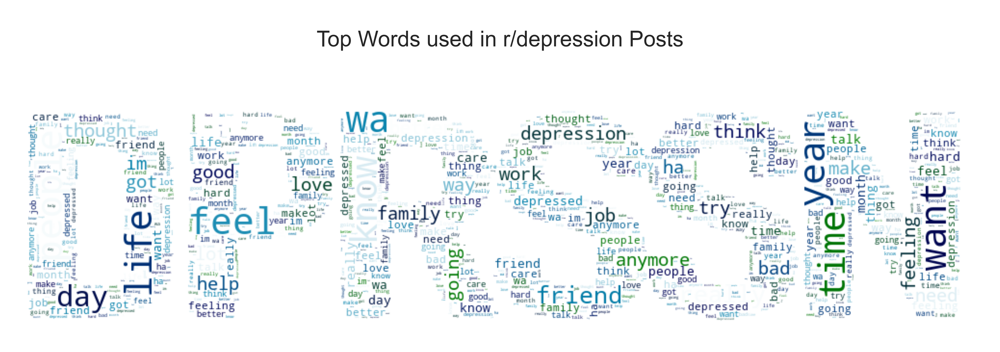

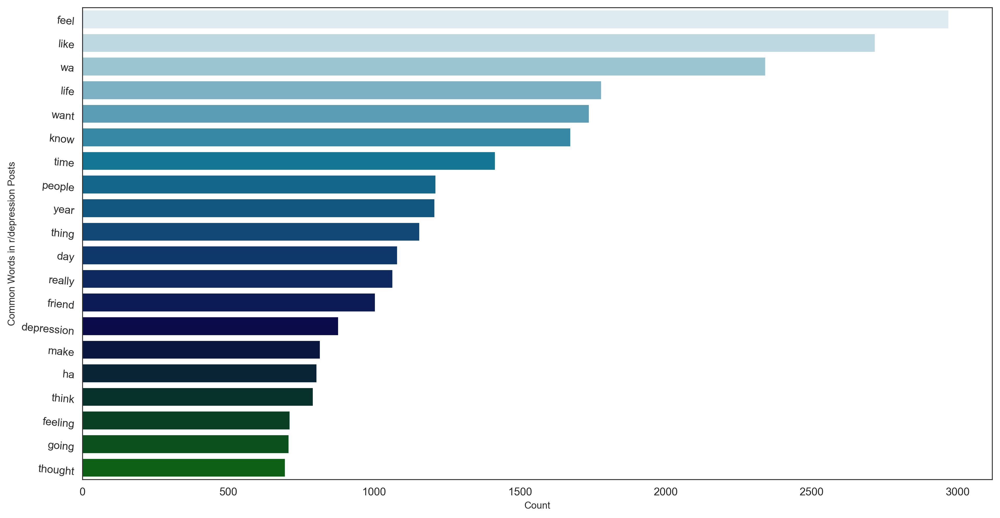

In [51]:
###CALLING THE FUNCTION ON r/depression POSTS
#WE'LL USE DIFFERENT PALETTES TO SEPERATE THE TWO REDDITS: 
#THE PENSIVE "ocean_r" FOR r/depression AND THE HEAVY AND DARK SHADES OF "magma" FOR FOR r/SuicideWatch 
plot_most_used_words("r/depression Posts", depression_posts, palette="ocean_r", image_mask="../assets/depression_mask.png")

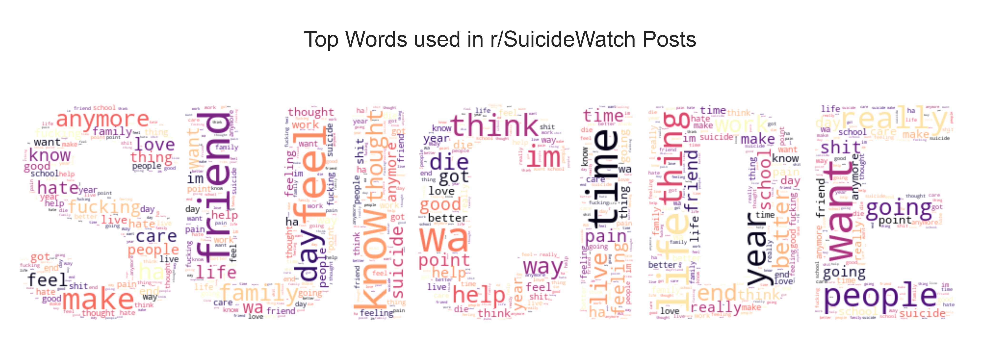

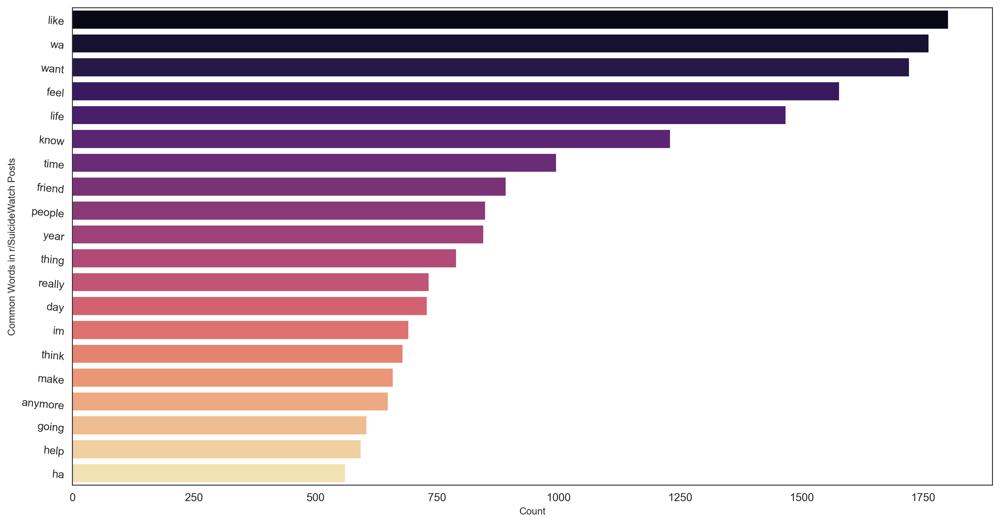

In [56]:
####CALLING THE FUNCTION ON r/SuicideWatch POSTS
plot_most_used_words("r/SuicideWatch Posts", suicide_posts, palette="magma", image_mask="../assets/suicide_mask.png")

#### Reviewing "Top Words" in posts
> **Many similar words** - We see a massive amount of similar words in our "top 20 words" from both subreddits like: wa, want, like, feel, life and people. This might make it difficult four our model. 

> **Unique words from r/depression** - "depression"

> **Unique words from r/SuicideWatch** - "anymore"

### 2.3.2 Top Words (subreddit Titles)
We will visualise the most-used words the our respective subreddit titles in a word cloud and a barplot. 

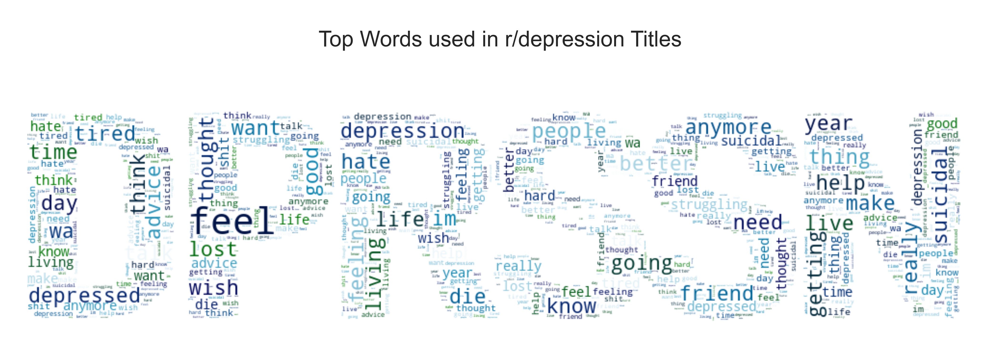

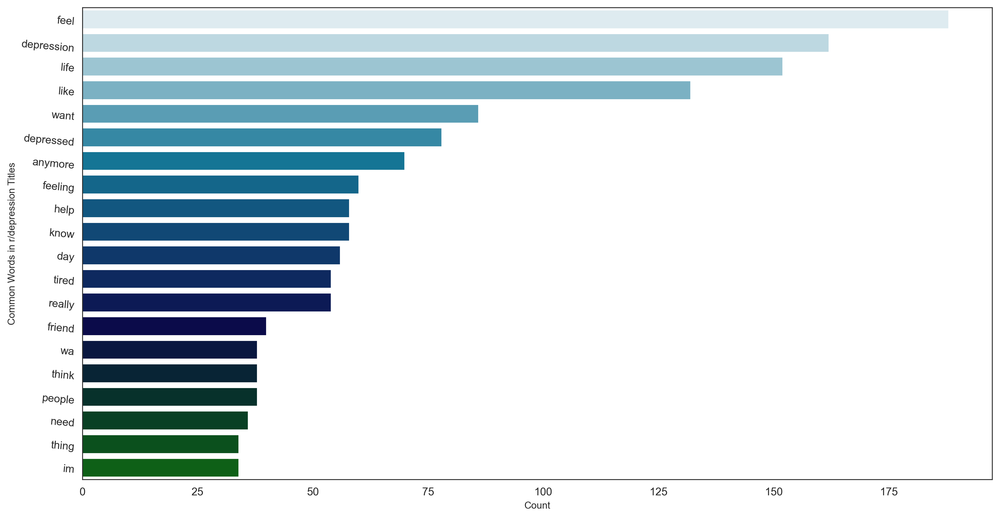

In [53]:
####CALLING THE FUNCTION ON r/depression TITLES
plot_most_used_words("r/depression Titles", depression_titles, palette="ocean_r", image_mask="../assets/depression_mask.png")

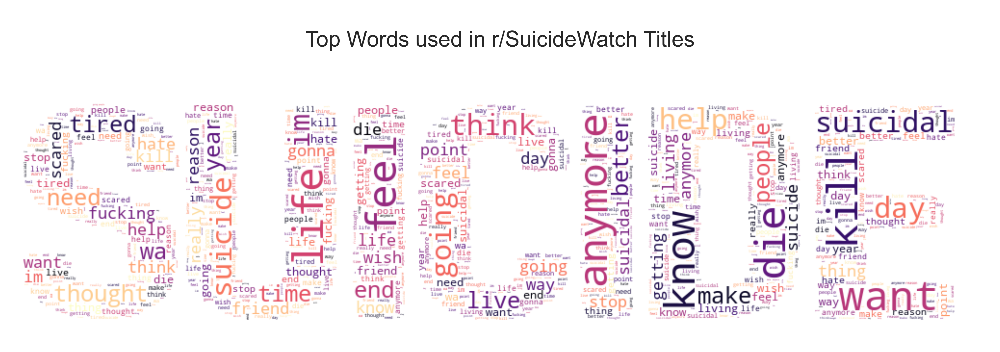

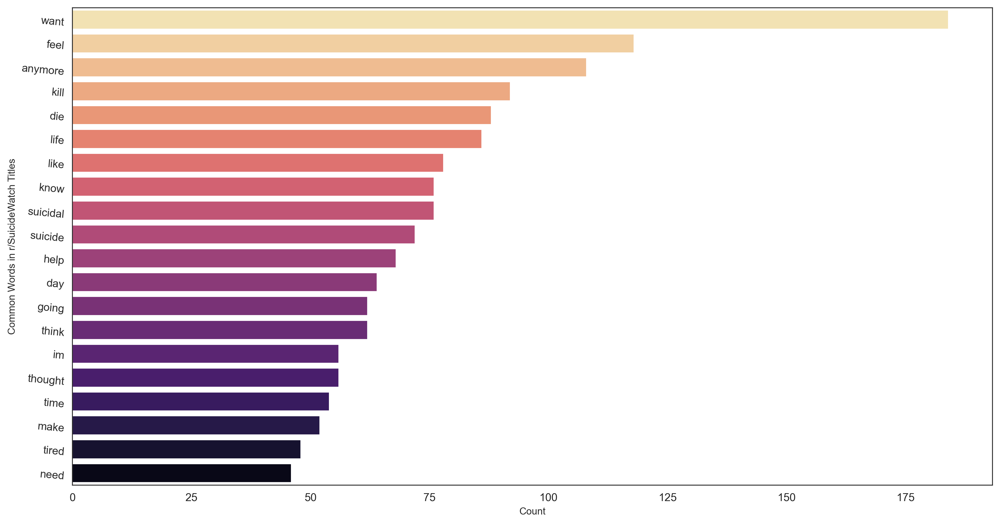

In [54]:
####CALLING THE FUNCTION ON r/SuicideWatch TITLES
plot_most_used_words("r/SuicideWatch Titles", suicide_titles, palette="magma_r", image_mask="../assets/suicide_mask.png")

#### Reviewing "Top Words" in titles
> **Titles a better differentiator?** - We still see a fair amount of similar words in our "top 20 words" in our titles, but much less than in Posts. As Titles in the two subreddits seem to differ more than Posts, it might serve as a better place for our models to hunt for features.

> **Unique words from r/depression titles** - "depression", "depressed", "hate"

> **Unique words from r/SuicideWatch titles** - "die", "kill", "suicidal", "live", "year"

> **The difference between Wanting and Feeling** - It is interesting to note that the top word in r/SuicideWatch is the word "want" and it is used more than twice compared to the word "feel". In r/depression, the top word is "feel" and similarly, is used close to twice the amount of times compared to "want". This trend is also reflected in our visualisations for posts. 

#### Lookin at authors with most posts and viewing if they have posted in both subreddit

In [144]:
#LOOKING AT AUTHORS WITH THE MOST POSTS
combined_data["author"].value_counts()[:10]

[deleted]               26
thesweetpotato282       12
Engineer-Still          10
sadninetiesgirl         10
Otherwise-Relation46     8
Tetreitan                8
Sea_Detail8594           8
MsTVs14                  8
Imaginary_Round_9598     8
2late4menow              8
Name: author, dtype: int64

#### #ISOLATING AUTHORS WHO HAVE POSTED MORE THAN ONCE and inspecting data

In [145]:
df_author_counts=(pd.DataFrame(combined_data["author"].value_counts()))
df_author_counts.reset_index(level=0, inplace=True)
authors_posting_more_than_once = list(df_author_counts[df_author_counts["author"]>1]["index"])
authors_posting_more_than_once[:40]

['[deleted]',
 'thesweetpotato282',
 'Engineer-Still',
 'sadninetiesgirl',
 'Otherwise-Relation46',
 'Tetreitan',
 'Sea_Detail8594',
 'MsTVs14',
 'Imaginary_Round_9598',
 '2late4menow',
 'fairykitty444',
 'Impossible-Swan-6091',
 'Suicidal-Cunt',
 'Wild-Camera7441',
 'SQLwitch',
 'Safe_Time1327',
 'PresentFormal2485',
 'CloudsofNothingness',
 'Embarrassed_Cup2524',
 'spencercore',
 'm00nfa1ry',
 'toolateforliving18',
 'Cotton_Skies',
 'dancing_dragon_',
 'sadpencil2',
 'very-sadge',
 'Throwawayhoraayy',
 'MinimumSpiritual2557',
 'BeatSpecial7184',
 'Ispeakinhands',
 'cryioboo',
 'jiminsjulia',
 'Lilchubbyspirit',
 'Wishmunk',
 'Survivorcptsd',
 'New-Mood-9805',
 'VegetableVivid2405',
 'Iscocoawesome',
 'EiraLumi',
 'M31Gavin']

In [150]:
pd.set_option("display.max_colwidth", 100)
combined_data[combined_data["author"]=="cryioboo"].head(5)

,title,selftext,author,num_comments,is_suicide,url,selftext_clean,title_clean,author_clean
648,I’m quitting therapy,It haven’t worked since 13(my mental health about my emotions have been on decadence)and now my ...,cryioboo,0,0,https://www.reddit.com/r/depression/comments/xvs19g/im_quitting_therapy/,worked since 13 mental health emotion decadence worst sanity yesterday mom picked jail wrist big...,quitting therapy,cry io boo
678,Is mexico ok? Should i feel ok?,"I cut myself yesterday, called 911 and told them someone was stalking me and i couldn’t handle i...",cryioboo,1,0,https://www.reddit.com/r/depression/comments/xvk9i3/is_mexico_ok_should_i_feel_ok/,cut yesterday called 911 told someone wa stalking handle got extension saying wa using emergency...,mexico ok feel ok,cry io boo
1744,Is mexico safe for mental health?,"I cut myself yesterday, called 911 and told them someone was stalking me and i couldn’t handle i...",cryioboo,1,1,https://www.reddit.com/r/SuicideWatch/comments/xvk5pg/is_mexico_safe_for_mental_health/,cut yesterday called 911 told someone wa stalking handle got extension saying wa using emergency...,mexico safe mental health,cry io boo
2588,I’m quitting therapy,It haven’t worked since 13(my mental health about my emotions have been on decadence)and now my ...,cryioboo,0,0,https://www.reddit.com/r/depression/comments/xvs19g/im_quitting_therapy/,worked since 13 mental health emotion decadence worst sanity yesterday mom picked jail wrist big...,quitting therapy,cry io boo
2618,Is mexico ok? Should i feel ok?,"I cut myself yesterday, called 911 and told them someone was stalking me and i couldn’t handle i...",cryioboo,1,0,https://www.reddit.com/r/depression/comments/xvk9i3/is_mexico_ok_should_i_feel_ok/,cut yesterday called 911 told someone wa stalking handle got extension saying wa using emergency...,mexico ok feel ok,cry io boo


In [159]:
####READING THE POSTS BY AUTHORS WITH THE MOST POSTS
pd.set_option("display.max_colwidth", 1000)

combined_data[["is_suicide","author","title", "selftext"]][combined_data["author"].isin
                                                           (["circinia",'thesweetpotato282', 'Engineer-Still',"Engineer-Still","thesweetpotato282", 
                                                             "Engineer-Still", "sadninetiesgirl", "Otherwise-Relation46","Tetreitan",
                                                             "Sea_Del8594","MsTVs14", "Imaginary_Round_9598",
                                                             "2late4menow", "fairykitty444", "Impossible-Swan-6091","Suicidal-Cunt", 
                                                             "Wild-Camera7441", "SQLwitch", "Safe_Time1327", 'SQLwitch', 
                                                             "MsTVs14"])].sort_values("author")[:10]

,is_suicide,author,title,selftext
1640,1,2late4menow,back to old habits,"i’m back to vomiting my guts out after every meal. i’ll probably get worse like i did before. vomiting till my throat hurts and burns, till i cant talk. i just cant do this. why must my illness control me? what did i do to deserve this? i’n shaking so badly i don’t even know whats wrong with me i just want to end it. j i can barely etype loke this pleass ehelp me"
3580,1,2late4menow,back to old habits,"i’m back to vomiting my guts out after every meal. i’ll probably get worse like i did before. vomiting till my throat hurts and burns, till i cant talk. i just cant do this. why must my illness control me? what did i do to deserve this? i’n shaking so badly i don’t even know whats wrong with me i just want to end it. j i can barely etype loke this pleass ehelp me"
3701,1,2late4menow,agony,i’m suffering so much i can’t do it anymore\n\ni just want the pain to end…
1761,1,2late4menow,agony,i’m suffering so much i can’t do it anymore\n\ni just want the pain to end…
3640,1,2late4menow,it’ll all be over soon,emptypost
1700,1,2late4menow,it’ll all be over soon,emptypost
1648,1,2late4menow,i want to cry,why am i so unwell why cant i do anything other people can do why do i have to suffer why am i always in pain why does my stomach hurt why do i vomit why do i have no friends why do i want to cry every day why do i hate school why cant i just be like everyone else why do i have to struggle why havent i killed myself yet
3588,1,2late4menow,i want to cry,why am i so unwell why cant i do anything other people can do why do i have to suffer why am i always in pain why does my stomach hurt why do i vomit why do i have no friends why do i want to cry every day why do i hate school why cant i just be like everyone else why do i have to struggle why havent i killed myself yet
3298,1,Engineer-Still,In my final days,Good luck in life for those that keep going
2306,0,Engineer-Still,I can’t stop crying,I’m truly barely holding on


In [160]:
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext"]][combined_data["author"].isin
                                                           (["SQLwitch"])].sort_values("author")[:10]

,is_suicide,author,title,selftext
1,0,SQLwitch,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first resort"", so we've made a new wiki to explain it","We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a..."
976,1,SQLwitch,"New wiki on how to avoid accidentally encouraging suicide, and how to spot covert incitement","We've been seeing a worrying increase in pro-suicide content showing up here and, and also going unreported. This undermines our purpose here, so we wanted to highlight and clarify our guidelines about both direct and indirect incitement of suicide. \n\nWe've created a wiki that covers these issues. We hope this will be helpful to anyone who's wondering whether something's okay here and which responses to report. It explains in detail why *any* validation of suicidal intent, even an ""innocent"" message like ""if you're 100% committed, I'll just wish you peace"" is likely to increase people's pain, and why it's important to report even subtle pro-suicide comments. The full text of the wiki's current version is below, and it is maintained at [/r/SuicideWatch/wiki/incitement](http://www.reddit.com/r/SuicideWatch/wiki/incitement). \n\nWe deeply appreciate everyone who gives responsive, empathetic, non-judgemental support to our OPs, and we particularly thank everyone who's already been..."
977,1,SQLwitch,Please remember that NO ACTIVISM of any kind is ever allowed here. No matter what day it is.,"Activism, i.e. advocating or fundraising for social change or raising awareness of social issues (and suicide is, inescapably, a social issue) is absolutely against the rules here at all times. \n\nPlease understand that we're all for smart, strategic mental-health and suicide-prevention activism. It's essential to fight against stigma, misinformation, and discrimination, and to fight for research, treatment, accommodation, acceptance, and understanding. Most of us, one way or another, are mental-health activists IRL. \n\nBut activism just doesn't work in a dedicated support space that serves a vulnerable population. We used to allow it but the evidence that it was undermining our primary purpose became overwhelming. We do regret the need for this rule, but the need is inescapable. \n\nOur population is all too well aware of the issues and causes that need support and largely not in a position to take action, so besides the fact that activism is often salt in our community's wound..."
1941,0,SQLwitch,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first resort"", so we've made a new wiki to explain it","We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support o

In [133]:
####READING THE POSTS BY AUTHORS WITH DELETED NAMES/ACCOUNTS
pd.set_option("display.max_colwidth", 1000)

combined_data[["is_suicide","author","title_clean", "selftext_clean"]][combined_data["author"].isin(["[deleted]"])].count()#sort_values("author")[:20]

is_suicide        26
author            26
title_clean       26
selftext_clean    26
dtype: int64

### Finding Authors who have posted in both subreddits

In [138]:
pd.set_option("display.max_colwidth", 100)

#CREATING A DATAFRAME WITH MEAN VALUES OF is_suicide
#A MEAN VALUE THAT IS NOT ONE OR ZERO WOULD INDICATE THAT THEY POST IN BOTH subreddits
more_than_once_mean_df = combined_data[combined_data["author"].isin(authors_posting_more_than_once)].groupby("author").mean()
more_than_once_mean_df.reset_index(level=0, inplace=True)
#CREATING MASK TO ISOLATE REDDITORS WHO HAVE POSTED IN BOTH FORUMS
double_posters_mask_0 = ((more_than_once_mean_df["is_suicide"]) !=0) 
double_posters_mask_1 = ((more_than_once_mean_df["is_suicide"]) !=1.0) 
#TRYING TO FIND OUT HOW MANY DOUBLE POSTERS THERE ARE
double_posters = more_than_once_mean_df[double_posters_mask_0][double_posters_mask_1].sort_values("num_comments", ascending=False)
print(len(double_posters))
#CREATING LIST OF TOP 7 DOUBLE POSTERS BY COMMENTS
top_double_posters_list= list(double_posters["author"][:20])
top_double_posters_list

36


C:\Users\prana\AppData\Local\Temp\ipykernel_11084\3939375953.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  double_posters = more_than_once_mean_df[double_posters_mask_0][double_posters_mask_1].sort_values("num_comments", ascending=False)


['SQLwitch',
 'very-sadge',
 'amustafa_96',
 'gluemeOTL',
 'SacredJujucc',
 'MatthewP0lska',
 '[deleted]',
 'Fair_Owl_2200',
 'ceaseToXist',
 'Bigbrain12341',
 'Wild-Camera7441',
 'BackgroundClick4903',
 'Mean_Lie4091',
 'Maleficent_Sock_8851',
 'in-the_void',
 'bxtx2020',
 'krobus_doobus',
 'TransitionShot8282',
 'Engineer-Still',
 'Few-Salamander-4483']

##### looking at who have posted in both subreddit and analyzing their text

In [139]:

pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext","url"]][combined_data["author"].isin(top_double_posters_list)].sort_values("author")[:20]
    

,is_suicide,author,title,selftext,url
3008,1,BackgroundClick4903,"Close to 50, don't want to start over","After decades of marriage she cheated, abused me, and left me financially wrecked. I have lost every career I have started, have been depressed since I was conscious, and can't stand the thought of continuing like this. For some reason I get out of bed, at some point throughout the day swallow whatever pills I'm supposed to take and wait to feel better. It's not happening. My therapist is great. I have friends. They're great. They don't have time for a daily trainwreck though. I sometimes can't get off the floor. I can't work. I am useless to anyone. Like my ex said when we were fighting, ""you will die alone."" I'm an only child, she meant if I lost her I would have nothing at the end. It just doesn't even matter, her words are hollow. I don't need anyone around, I just need to make this pain stop.",https://www.reddit.com/r/SuicideWatch/comments/xxotgr/close_to_50_dont_want_to_start_over/
2127,0,BackgroundClick4903,Every minute is different,"I am coping with a lot of trauma and depression right now, and it's a roller coaster. Some moments I can't get out of bed, others I am pacing and muttering hateful things to myself, then next moment I'm smoking or shoving snack food in my face. A friend made me laugh the other night, but as soon as we hung up I started crying again. I have trouble eating normally or bathing. Today is a little better than yesterday, I just remembered I still need to take my meds. Fuck depression.",https://www.reddit.com/r/depression/comments/xx889d/every_minute_is_different/
187,0,BackgroundClick4903,Every minute is different,"I am coping with a lot of trauma and depression right now, and it's a roller coaster. Some moments I can't get out of bed, others I am pacing and muttering hateful things to myself, then next moment I'm smoking or shoving snack food in my face. A friend made me laugh the other night, but as soon as we hung up I started crying again. I have trouble eating normally or bathing. Today is a little better than yesterday, I just remembered I still need to take my meds. Fuck depression.",https://www.reddit.com/r/depression/comments/xx889d/every_minute_is_different/
1068,1,BackgroundClick4903,"Close to 50, don't want to start over","After decades of marriage she cheated, abused me, and left me financially wrecked. I have lost every career I have started, have been depressed since I was conscious, and can't stand the thought of continuing like this. For some reason I get out of bed, at some point throughout the day swallow whatever pills I'm supposed to take and wait to feel better. It's not happening. My therapist is great. I have friends. They're great. They don't have time for a daily trainwreck though. I sometimes can't get off the floor. I can't work. I am useless to anyone. Like my ex said when we were fighting, ""you will die alone."" I'm an only child, she meant if I lost her I would have nothing at the end. It just doesn't even matter, her words are hollow. I don't need anyone around, I just need to make this pain stop.",https://www.reddit.com/r/SuicideWatch/comments/xxotgr/close_to_50_dont_want_to_start_over/
2070,0,Bigbrain12341,i failed,i failed the the first quarter of freshman year of highschool. i dont know how to feel. i dont know anymore. i feel like a total dumbass and failure.,https://www.reddit.com/r/depression/comments/xxih6r/i_failed/
130,0,Bigbrain12341,i failed,i failed the the first quarter of freshman year of highschool. i dont know how to feel. i dont know anymore. i feel like a total dumbass and failure.,https://www.reddit.com/r/depression/comments/xxih6r/i_failed/
3312,1,Bigbrain12341,my friends wonr know i killed myself,yay,https://www.reddit.com/r/SuicideWatch/comments/xwujp4/my_friends_wonr_know_i_killed_myself/
1372,1,Bigbrain12341,my friends wonr know i killed myself,yay,https://www.reddit.com/r/SuicideWatch/comments/xwujp4/my_friends_wonr_know_i_killed_my

#### Reviewing Significant Authors

SQLWitch and circinia seems to be a moderating presence in both subreddits. Appearing a couple of times to remind redditors about rules like non-activism and not posting pro-suicide posts. SQLWitch's posts hints at the culture both communities, which are similar help-seeking, problem-airing forums. 

###### Aside from SQLWitch and circinia, there are other users who have posted on both forums so we will keep their texts but will remove circinia and SQLWitch's texts 

In [182]:

SQLwitch_index= combined_data[combined_data.author.str.contains("SQLwitch")].index
circinia_index= combined_data[combined_data.author.str.contains("circinia")].index
combined_data.drop(index=SQLwitch_index, inplace=True)
combined_data.drop(index=circinia_index, inplace=True)




In [185]:
## Verifying Data
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext"]][combined_data["author"].isin
                                                           (["SQLwitch",'circinia'])].sort_values("author")[:10]

,is_suicide,author,title,selftext


### 2.3.5 Length of posts
We have already noticed a significant number of posts with no words in r/SuicideWatch posts. We should dive in to check out what the number of words are in an average post in each subreddit.  

In [189]:
combined_data=combined_data.reset_index()
combined_data.index

RangeIndex(start=0, stop=3872, step=1)

In [190]:
combined_data["selftext_length"]= [len(combined_data["selftext"][i]) for i in range(len(combined_data))]

In [191]:
combined_data["title_length"]= [len(combined_data["title"][i]) for i in range(len(combined_data))]

In [192]:
ave_length_dep_title = combined_data["title_length"][combined_data["is_suicide"] ==0].mean()
ave_length_sui_title = combined_data["title_length"][combined_data["is_suicide"] ==1].mean()
ave_length_dep_post = combined_data["selftext_length"][combined_data["is_suicide"] ==0].mean()
ave_length_sui_post = combined_data["selftext_length"][combined_data["is_suicide"] ==1].mean()

print("Average length of a r/depression title: {}".format(ave_length_dep_title))
print("Average length of a r/SuicideWatch title: {}".format(ave_length_sui_title))
print("Average length of a r/depression post: {}".format(ave_length_dep_post))
print("Average length of a r/SuicideWatch post: {}".format(ave_length_sui_post))

Average length of a r/depression title: 37.385010266940455
Average length of a r/SuicideWatch title: 39.685031185031185
Average length of a r/depression post: 942.3562628336756
Average length of a r/SuicideWatch post: 756.8180873180874


### Since title can give us insight as well.. We will combine text and title together for our model

### this way even for the empty posts in Suicide Watch, we will have text that have some meaning and would help in creating a model

In [195]:
#CREATING A megatext COLUMN
combined_data["megatext_clean"]=combined_data["selftext_clean"]+ " " +combined_data["title_clean"]

In [199]:
#CREATING A DATAFRAME FOR SCATTERTEXT and creating cateogry of Suicide or not
scatter_data = combined_data[["megatext_clean", "is_suicide"]]
scatter_data["category"] = scatter_data["is_suicide"].map({0: "Depression", 1: "Suicide"})
scatter_data.category.value_counts()

Depression    1948
Suicide       1924
Name: category, dtype: int64

In [202]:
#PARSING TEXT FOR SCATTERTEXT and splitting words
nlp = st.whitespace_nlp_with_sentences

scatter_data.groupby("category").apply(lambda x: x.megatext_clean.apply(lambda x: len(x.split())).sum())


category
Depression    170396
Suicide       138360
dtype: int64

In [204]:

scatter_data['parsed'] = scatter_data.megatext_clean.apply(nlp)
scatter_data[:20]

C:\Users\prana\AppData\Local\Temp\ipykernel_11084\2613086750.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scatter_data['parsed'] = scatter_data.megatext_clean.apply(nlp)


,megatext_clean,is_suicide,category,parsed
0,turning 22 next year feel scary old wish could go back time different people around loving caring people feel emotionally safe mental illness ruin life age 12 hate getting older want kid finally childhood needed,0,Depression,"(turning, 22, next, year, feel, scary, old, wish, could, go, back, time, different, people, around, loving, caring, people, feel, emotionally, safe, mental, illness, ruin, life, age, 12, hate, getting, older, want, kid, finally, childhood, needed)"
1,okay trigger warning wazoo wa drink last week got fairly far rabbit hole distinctly remember telling near total stranger really want alive like spilled secret kind stuck ever since true worse happened forgot quite word express clock wa going want die even thought hurting crystallised wa watching tiktok someone asked question feel truck wa speeding toward wa honest wa sigh relief life account great loving wife bought house career always wanted lucky enough lot people consider close friend struggled depression extremely low self esteem entire life usually managed fight keep top done rested gotten pushed moderately fucked shit happen year done lot work therapy process working relationship parent kinder certain thing fault made absolutely enormous progress extremely proud actually say general like think deserve nice thing underneath basement become aware like boiler room one spooky one nobody go meant fire warmth dead cold maybe wa never lit warmth meant thing hold onto fight joie de v...,0,Depression,"(okay, trigger, warning, wazoo, wa, drink, last, week, got, fairly, far, rabbit, hole, distinctly, remember, telling, near, total, stranger, really, want, alive, like, spilled, secret, kind, stuck, ever, since, true, worse, happened, forgot, quite, word, express, clock, wa, going, want, die, even, thought, hurting, crystallised, wa, watching, tiktok, someone, asked, question, feel, truck, wa, speeding, toward, wa, honest, wa, sigh, relief, life, account, great, loving, wife, bought, house, career, always, wanted, lucky, enough, lot, people, consider, close, friend, struggled, depression, extremely, low, self, esteem, entire, life, usually, managed, fight, keep, top, done, rested, gotten, pushed, moderately, fucked, shit, happen, year, ...)"
2,22 disabled w abusive parent 4 yr long distance relationship quite literally sweetest person could ever met easiest healthy relationship literal life partner wish could give everything deserves anyway im broke saving trying get away abusive parent say broke mean broke disabled hard young worse broke without many job option put wheelchair 35 run lift barely walk far anymore 677 mental problem including depression anxiety insomnia constant fight eating disorder wish life would start poor ruining life,0,Depression,"(22, disabled, w, abusive, parent, 4, yr, long, distance, relationship, quite, literally, sweetest, person, could, ever, met, easiest, healthy, relationship, literal, life, partner, wish, could, give, everything, deserves, anyway, im, broke, saving, trying, get, away, abusive, parent, say, broke, mean, broke, disabled, hard, young, worse, broke, without, many, job, option, put, wheelchair, 35, run, lift, barely, walk, far, anymore, 677, mental, problem, including, depression, anxiety, insomnia, constant, fight, eating, disorder, wish, life, would, start, poor, ruining, life)"
3,hello kind person always lot suicidal thought barely keeping alive really need someone talk anyone lot mental physical turmoil rn please someone talk suicidal ideation breaking apart rn,0,Depression,"(hello, kind, person, always, lot, suicidal, thought, barely, keeping, alive, really, need, someone, talk, anyone, lot, mental, physical, turmoil, rn, please, someone, talk, suicidal, ideation, breaking, apart, rn)"
4,found increasingly upsetting say term existence crazy human expected live life content ne great full think would concerning someone living miserable life seeming happy clam rather want end l

In [205]:
#DEFINING A CORPUS FOR SCATTERTEXT
corpus = st.CorpusFromParsedDocuments(scatter_data, category_col="category", parsed_col="parsed").build()

In [88]:
#CHECKING IF there are any Missing Data
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1940 entries, 0 to 1939
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   title            1940 non-null   object
 1   selftext         1940 non-null   object
 2   author           1940 non-null   object
 3   num_comments     1940 non-null   int64 
 4   is_suicide       1940 non-null   int64 
 5   url              1940 non-null   object
 6   selftext_clean   1940 non-null   object
 7   title_clean      1940 non-null   object
 8   author_clean     1940 non-null   object
 9   selftext_length  1940 non-null   int64 
 10  title_length     1940 non-null   int64 
 11  megatext_clean   1940 non-null   object
dtypes: int64(4), object(8)
memory usage: 182.0+ KB


#### NOTE: I've commented out the code in the next cell for "pd.to_csv" to prevent any accidental overwriting of the the saved dataset.**

In [206]:
#SAVING combined_data
combined_data.to_csv('../data/data_for_model_new.csv', index = False)